In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np


In [3]:
df = pd.read_csv("housing.csv")
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
198,-122.23,37.77,52.0,769.0,206.0,612.0,183.0,2.5700,72000.0,NEAR BAY
9373,-122.53,37.92,45.0,1530.0,324.0,608.0,328.0,3.8750,390800.0,NEAR BAY
18564,-121.74,36.92,29.0,1210.0,281.0,863.0,262.0,3.1062,156000.0,<1H OCEAN
19876,-119.31,36.33,46.0,1636.0,338.0,772.0,332.0,2.4250,84900.0,INLAND
13559,-117.30,34.09,40.0,1051.0,244.0,745.0,243.0,2.1842,75200.0,INLAND


In [4]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [5]:
df.shape

(20640, 10)

In [18]:
print(df['median_house_value'].value_counts())

median_house_value
500001.0    965
137500.0    122
162500.0    117
112500.0    103
187500.0     93
           ... 
359200.0      1
54900.0       1
377600.0      1
81200.0       1
47000.0       1
Name: count, Length: 3842, dtype: int64


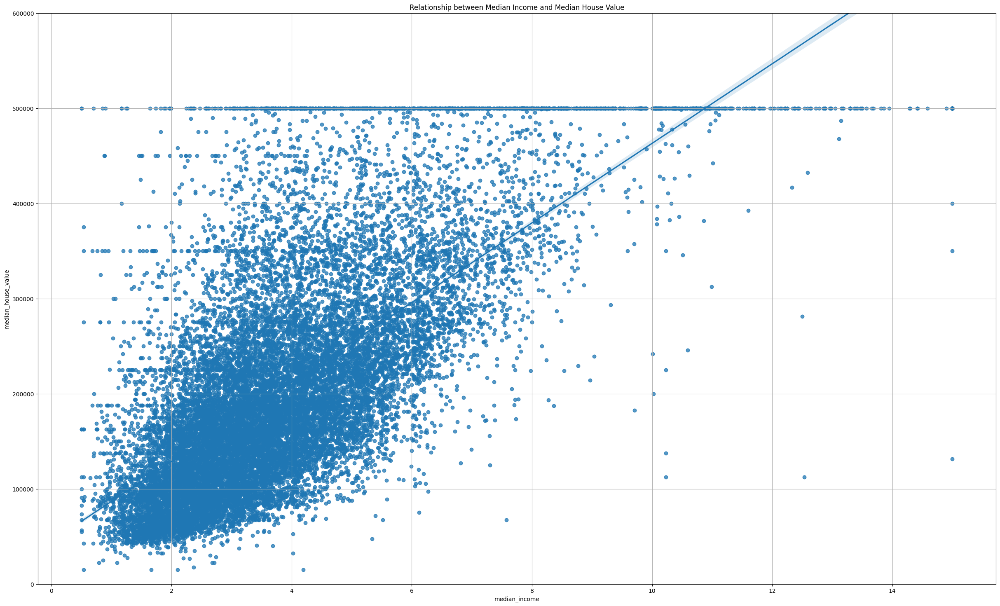

In [19]:
plt.figure(figsize=(30, 18))
plt.scatter(df['median_income'], df['median_house_value'], alpha=0.5)
plt.title('Relationship between Median Income and Median House Value')
plt.xlabel('Median Income')
plt.ylabel('Median House Value')

plt.ylim(0, df['median_house_value'].max() + 100000)
sns.regplot(x='median_income', y='median_house_value', data=df, scatter_kws={'alpha':0.5})

plt.grid(True)
plt.show()

In [22]:
import folium

map_ca = folium.Map(location=[36.7783, -119.4179], zoom_start=6)  

for index, row in df.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    house_value = row['median_house_value']

    folium.CircleMarker(
        location=[latitude, longitude],
        radius=5,
        color='blue' if house_value < 200000 else 'green' if house_value < 500000 else 'red',  # Color by house price
        fill=True,
        fill_color='blue' if house_value < 200000 else 'green' if house_value < 500000 else 'red',
        fill_opacity=0.6,
    ).add_to(map_ca)

map_ca
